In [1]:
!rm -r '/content/sample_data'
!nvidia-smi

Mon Nov 27 09:48:35 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8    12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install --upgrade tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.3/612.3 kB 6.5 MB/s eta 0:00:00


In [6]:
! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/

! chmod 600 ~/.kaggle/kaggle.json

In [7]:
!kaggle datasets download -d brsdincer/vehicle-detection-image-set

 88% 105M/119M [00:00<00:00, 155MB/s] 
100% 119M/119M [00:00<00:00, 128MB/s]


In [ ]:
!unzip '/content/vehicle-detection-image-set.zip'

In [9]:
categories=['non-vehicles','vehicles']
dataset_path='/content/data'

In [10]:
import os
import cv2
import random
import numpy as np
img_size=150
data=[]
for category in categories:
    folder=os.path.join(dataset_path,category)
    label=categories.index(category)
    for img in os.listdir(folder):
        img_path=os.path.join(folder,img)
        img_arr=cv2.imread(img_path)
        img_arr=cv2.resize(img_arr,(img_size, img_size))
        data.append([img_arr, label])

random.shuffle(data)
len(data)

17760

In [11]:
x=[]
y=[]
for i,j in data:
  x.append(i)
  y.append(j)

In [12]:
x = np.array(x)
x.shape

(17760, 150, 150, 3)

In [13]:

y=np.array(y)
y= np.asarray(y).astype('float32').reshape((-1,1))
y.shape

(17760, 1)

In [14]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=2)

In [27]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
import json
import datetime

In [23]:
with open('hyperparam.json') as f:
    hyperparams = json.load(f)

# Access the hyperparameters
learning_rate = hyperparams['learning_rate']
weight_decay = hyperparams['weight_decay']
batch_size = hyperparams['batch_size']
num_epochs = hyperparams['num_epochs']
image_size = hyperparams['image_size']
patch_size = hyperparams['patch_size']
num_patches = hyperparams['num_patches']
projection_dim = hyperparams['projection_dim']
num_heads = hyperparams['num_heads']
transformer_units = hyperparams['transformer_units']
transformer_layers = hyperparams['transformer_layers']
mlp_head_units = hyperparams['mlp_head_units']
num_classes = hyperparams['num_classes']
input_shape = hyperparams['input_shape']

In [15]:
data_augmentation = keras.Sequential(
    [
        layers.Normalization(),
        layers.Resizing(image_size, image_size),
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(factor=0.02),
        layers.RandomZoom(height_factor=0.2, width_factor=0.2),
    ],
    name="data_augmentation",
)
# Compute the mean and the variance of the training data for normalization.
data_augmentation.layers[0].adapt(X_train)

In [16]:
## Implement multilayer perceptron (MLP)
def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

In [17]:
#patch embedding

class Patches(layers.Layer):
    def __init__(self, patch_size):
        super().__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

Image size: 72 X 72
Patch size: 18 X 18
Patches per image: 16
Elements per patch: 972


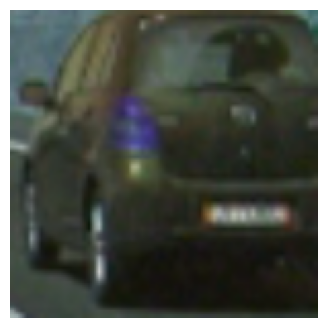

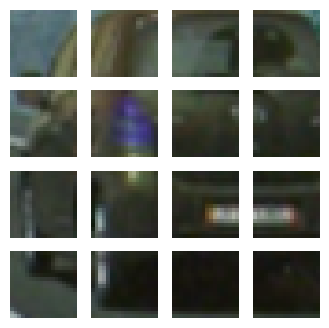

In [18]:
#display patches

from matplotlib import pyplot as plt

plt.figure(figsize=(4, 4))
image = X_train[np.random.choice(range(X_train.shape[0]))]
plt.imshow(image.astype("uint8"))
plt.axis("off")

resized_image = tf.image.resize(
    tf.convert_to_tensor([image]), size=(image_size, image_size)
)
patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")

n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")

In [19]:
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim=num_patches, output_dim=projection_dim
        )

    def call(self, patch):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encoded = self.projection(patch) + self.position_embedding(positions)
        return encoded

In [20]:
def create_vit_classifier():
    inputs = layers.Input(shape=input_shape)
    # Augment data.
    augmented = data_augmentation(inputs)
    # Create patches.
    patches = Patches(patch_size)(augmented)
    # Encode patches.
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)

    # Create multiple layers of the Transformer block.
    for _ in range(transformer_layers):
        # Layer normalization 1.
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        # Create a multi-head attention layer.
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.1
        )(x1, x1)
        # Skip connection 1.
        x2 = layers.Add()([attention_output, encoded_patches])
        # Layer normalization 2.
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        # MLP.
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.1)
        # Skip connection 2.
        encoded_patches = layers.Add()([x3, x2])

    # Create a [batch_size, projection_dim] tensor.
    representation = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    representation = layers.Flatten()(representation)
    representation = layers.Dropout(0.5)(representation)
    # Add MLP.
    features = mlp(representation, hidden_units=mlp_head_units, dropout_rate=0.5)
    # Classify outputs.
    logits = layers.Dense(num_classes)(features)
    # Create the Keras model.
    model = keras.Model(inputs=inputs, outputs=logits)
    return model


In [26]:
vit_classifier = create_vit_classifier()
vit_classifier.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 data_augmentation (Sequent  (None, 72, 72, 3)            7         ['input_3[0][0]']             
 ial)                                                                                             
                                                                                                  
 patches_3 (Patches)         (None, None, 972)            0         ['data_augmentation[2][0]']   
                                                                                                  
 patch_encoder_2 (PatchEnco  (None, 16, 64)               63296     ['patches_3[0][0]']     

In [22]:
%load_ext tensorboard
%tensorboard --logdir=logs

<IPython.core.display.Javascript object>

In [28]:
def run_experiment(model):
    optimizer = tfa.optimizers.AdamW(
        learning_rate=learning_rate, weight_decay=weight_decay
    )

    model.compile(
        optimizer=optimizer,
        loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=[
            keras.metrics.SparseCategoricalAccuracy(name="accuracy")
        ]
    )

    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

    checkpoint_filepath = "/tmp/checkpoint"
    checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor="val_accuracy",
        save_best_only=True,
        save_weights_only=True,
    )

    history = model.fit(
        x=X_train,
        y=y_train,
        batch_size=batch_size,
        epochs=num_epochs,
        validation_data=(X_test,y_test),
        callbacks=[checkpoint_callback,
                   tensorboard_callback]
    )

    model.load_weights(checkpoint_filepath)

    return history


vit_classifier = create_vit_classifier()
history = run_experiment(vit_classifier)

Epoch 1/50
93/93 [==============================] - 23s 115ms/step - loss: 0.4158 - accuracy: 0.8497 - val_loss: 0.1138 - val_accuracy: 0.9620
Epoch 2/50
93/93 [==============================] - 8s 87ms/step - loss: 0.1604 - accuracy: 0.9388 - val_loss: 0.0789 - val_accuracy: 0.9691
Epoch 3/50
93/93 [==============================] - 7s 74ms/step - loss: 0.1006 - accuracy: 0.9625 - val_loss: 0.0565 - val_accuracy: 0.9802
Epoch 4/50
93/93 [==============================] - 8s 82ms/step - loss: 0.0841 - accuracy: 0.9707 - val_loss: 0.0649 - val_accuracy: 0.9771
Epoch 5/50
93/93 [==============================] - 7s 75ms/step - loss: 0.0670 - accuracy: 0.9733 - val_loss: 0.0479 - val_accuracy: 0.9850
Epoch 6/50
93/93 [==============================] - 8s 88ms/step - loss: 0.0615 - accuracy: 0.9791 - val_loss: 0.0427 - val_accuracy: 0.9858
Epoch 7/50
93/93 [==============================] - 7s 79ms/step - loss: 0.0548 - accuracy: 0.9800 - val_loss: 0.0289 - val_accuracy: 0.9894
Epoch 8/50


BenchMark MODELS

1. CNN

In [25]:
model= tf.keras.Sequential()
model.add(layers.Conv2D(16,(5,5), activation='relu'))
model.add(layers.MaxPooling2D(2,2))
model.add(layers.Conv2D(32,(5,5), activation='relu'))
model.add(layers.MaxPooling2D(2,2))
model.add(layers.Conv2D(64,(5,5), activation='relu'))
model.add(layers.MaxPooling2D(2,2))
model.add(layers.Flatten())
model.add(layers.Dense(units=128 ,input_shape=X_train.shape[1:],activation='relu'))
model.add(layers.Dense(units=2,activation='softmax'))

model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True),
              optimizer='adam',
              metrics=['accuracy'])
model.build(X_train.shape)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (11899, 146, 146, 16)     1216      
                                                                 
 max_pooling2d (MaxPooling2  (11899, 73, 73, 16)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (11899, 69, 69, 32)       12832     
                                                                 
 max_pooling2d_1 (MaxPoolin  (11899, 34, 34, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (11899, 30, 30, 64)       51264     
                                                                 
 max_pooling2d_2 (MaxPoolin  (11899, 15, 15, 64)       0

In [29]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

hist=model.fit(X_train,y_train, batch_size=batch_size, epochs=num_epochs, validation_data=(X_test,y_test),callbacks=[tensorboard_callback])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5729: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


93/93 [==============================] - 18s 94ms/step - loss: 6.3683 - accuracy: 0.8607 - val_loss: 0.1084 - val_accuracy: 0.9650
Epoch 2/50
93/93 [==============================] - 7s 74ms/step - loss: 0.1012 - accuracy: 0.9665 - val_loss: 0.1027 - val_accuracy: 0.9647
Epoch 3/50
93/93 [==============================] - 7s 72ms/step - loss: 0.0783 - accuracy: 0.9711 - val_loss: 0.0898 - val_accuracy: 0.9766
Epoch 4/50
93/93 [==============================] - 6s 68ms/step - loss: 0.0578 - accuracy: 0.9810 - val_loss: 0.0629 - val_accuracy: 0.9794
Epoch 5/50
93/93 [==============================] - 6s 67ms/step - loss: 0.0596 - accuracy: 0.9789 - val_loss: 0.0674 - val_accuracy: 0.9778
Epoch 6/50
93/93 [==============================] - 7s 74ms/step - loss: 0.0433 - accuracy: 0.9859 - val_loss: 0.0476 - val_accuracy: 0.9846
Epoch 7/50
93/93 [==============================] - 7s 72ms/step - loss: 0.0319 - accuracy: 0.9903 - val_loss: 0.1007 - val_accuracy: 0.9654
Epoch 8/50
93/93 [=====